In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# Read simulated data

In [2]:
data = pd.read_csv(
    './data/output_files_heating_cooling_multiple_parameters__12348__with wall U-value.csv',
    index_col=0,
)

data.index.name = 'Simulation'
data.head()

,Insulation thickness (m),Wall U-value (W/m2K),Window U-value (W/m2K),Window SHGC (ratio),Shading control (W/m2),Thermostat settings offset (C),Heating energy (kWh),Cooling energy (kWh),Total energy (kWh),Heating energy (kWh/m2),Cooling energy (kWh/m2),Total energy (kWh/m2)
Simulation,,,,,,,,,,,,
0,0.001,2.84,2.4,0.2,0,3,5071.7,340.4,5412.2,219.6,14.7,234.3
1,0.001,2.84,2.4,0.2,0,2,4756.3,458.6,5214.9,205.9,19.9,225.8
2,0.001,2.84,2.4,0.2,0,1,4440.6,591.6,5032.2,192.2,25.6,217.8
3,0.001,2.84,2.4,0.2,0,0,4127.0,728.0,4855.0,178.7,31.5,210.2
4,0.001,2.84,2.4,0.2,0,-1,3816.3,863.0,4679.4,165.2,37.4,202.6


# Split Data

In [21]:
X = data.iloc[:, 0:6] # First 6 features are independent variables
y = data.iloc[:, 6:9] # Next 3 features are dependent variables

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

room_size = data['Total energy (kWh)'] / data['Total energy (kWh/m2)']

# Evaluation Metrics
Function to determine the evaluation scores of the models

In [6]:
def get_evaluation_scores(y_test, y_test_pred):
    score_r2 = r2_score(y_test, y_test_pred)
    mse = mean_squared_error(y_test, y_test_pred)
    print('--- Combined Scores ---')
    print(f'R2: {score_r2:.2f}')
    print(f'MSE: {mse:.2f}')

    score_r2_heating = r2_score(y_test.iloc[:,0], y_test_pred[:,0])
    score_mse_heating = mean_squared_error(y_test.iloc[:,0], y_test_pred[:,0])
    print('\n--- Heating Energy Scores ---')
    print(f'R2: {score_r2_heating:.2f}')
    print(f'MSE: {score_mse_heating:.2f}')
    
    score_r2_cooling = r2_score(y_test.iloc[:,1], y_test_pred[:,1])
    score_mse_cooling = mean_squared_error(y_test.iloc[:,1], y_test_pred[:,1])
    print('\n--- Cooling Energy Scores ---')
    print(f'R2: {score_r2_cooling:.2f}')
    print(f'MSE: {score_mse_cooling:.2f}')

    score_r2_total = r2_score(y_test.iloc[:,2], y_test_pred[:,2])
    score_mse_total = mean_squared_error(y_test.iloc[:,2], y_test_pred[:,2])
    print('\n--- Total Energy Scores ---')
    print(f'R2: {score_r2_total:.2f}')
    print(f'MSE: {score_mse_total:.2f}')

# Plot real vs predicted values
Function for plotting a models real and predicted test values

In [7]:
def plot_real_vs_pred_vals(y_test, y_test_pred, model_name):
        fig, axes = plt.subplots(ncols=3, figsize=(10, 4), dpi=200)

        axes[0].scatter(
                y_test.iloc[:,0],
                y_test_pred[:,0],
                alpha=0.1,
                color='orange',
                label=f'$R^2 = $ {r2_score(y_test.iloc[:,0], y_test_pred[:,0]):.2f}')
        axes[0].set_title('Heating Energy')
        axes[0].set_ylabel("Real values")
        axes[0].set_xlabel("Predicted values")
        axes[0].grid()
        axes[0].legend()

        axes[1].scatter(
                y_test.iloc[:,1],
                y_test_pred[:,1],
                alpha=0.1,
                color='orange',
                label=f'$R^2 = $ {r2_score(y_test.iloc[:,1], y_test_pred[:,1]):.2f}')
        axes[1].set_title('Cooling Energy')
        axes[1].set_ylabel("Real values")
        axes[1].set_xlabel("Predicted values")
        axes[1].grid()
        axes[1].legend()

        axes[2].scatter(
                y_test.iloc[:,2],
                y_test_pred[:,2],
                alpha=0.1,
                color='orange',
                label=f'$R^2 = $ {r2_score(y_test.iloc[:,2], y_test_pred[:,2]):.2f}')
        axes[2].set_title('Total Energy')
        axes[2].set_ylabel("Real values")
        axes[2].set_xlabel("Predicted values")
        axes[2].grid()
        axes[2].legend()

        fig.suptitle(f'Real and Predicted values ({model_name})')
        plt.tight_layout()

        plt.savefig(f'./results/real_vs_predicted_{model_name}.png')
        plt.show()

# Predict for variable while holding other variables constant
Since this multivariate regression consists of more parameters than can fit on a two-dimensional plot, a separate scatter plot must be created for each dependent and independent variable. Each column of the figure corresponds to the type of energy for which a prediction is to be made, and each row corresponds to one of the independent variables.

To plot the regression curve, values for all five features must be passed to the regression function, even though only one of the features can be displayed on the x-axis. Therefore, all other features are held constant at their median values given in the table below, similar to how it is described  [here](https://www.scribbr.com/statistics/multiple-linear-regression/).

| Feature       | Constant value (Median)  |
|--------------------------------|------|
| Insulation thickness (m)       | 0.2  |
| Wall U-value (W/m2K)           | 0.17 |
| Window U-value (W/m2K)         | 1.5 |
| Window SHGC (ratio)            | 0.5  |
| Shading control (W/m2)         | 500  |
| Thermostat settings offset (C) | 0    |

In [8]:
# Number of points that will make up the regression curve
N_POINTS_TO_PLOT = 20

# Calculate constant values for each feature
fixed_values = X.median()

# Independent values to use for prediction for each variable
values_to_predict = {}
for feature in X.columns:
    values_to_predict[feature] = np.linspace(X[feature].min(), X[feature].max(), num=N_POINTS_TO_PLOT)

# Create dictionary to use for prediction
predictions_for_plot = {}
fixed_values_dict = {feature: N_POINTS_TO_PLOT * [fixed_value] for feature, fixed_value in fixed_values.items()}

In [14]:
def predict_energy_consumptions(y_test, y_test_pred, model, model_name):
    for feature in X.columns:
        fixed_values_dataset = pd.DataFrame(fixed_values_dict)
        fixed_values_dataset[feature] = values_to_predict[feature]
        prediction = model.predict(fixed_values_dataset)
        predictions_for_plot[feature] = prediction

    n_features = len(X.columns)
    n_energy = len(y.columns)

    fig, axs = plt.subplots(ncols=n_energy, nrows=n_features, figsize=(12,16), dpi=200)

    for feature_id, feature in enumerate(X.columns):
        for energy_id, energy_type in enumerate(y.columns):
            axs[feature_id, energy_id].scatter(x=X_test[feature], y=y_test.iloc[:,energy_id], s=50, alpha=0.05, label='Test Values')
            axs[feature_id, energy_id].scatter(x=X_test[feature], y=y_test_pred[:,energy_id], s=10, alpha=0.05, label='Test Predictions')
            axs[feature_id, energy_id].plot(values_to_predict[feature], predictions_for_plot[feature][:, energy_id], c='red', label='Regression (Constant Features)')
            axs[feature_id, energy_id].set_xlabel(feature)
            axs[feature_id, energy_id].set_ylabel(energy_type)
            leg = axs[feature_id, energy_id].legend(fontsize=7)
            for lh in leg.legendHandles: 
                lh.set_alpha(1)

            axs[feature_id, energy_id].grid()

    fig.suptitle(f'Energy Consumption Prediction ({model_name})')
    fig.tight_layout()

    plt.savefig(f'./results/{model_name}.png')
    plt.show()

# LinearRegression
First, a simple linear model is trained. With R2=0.76 it is not performing well, indicating that the relationship between the variables is nonlinear to some degree.

--- Combined Scores ---
R2: 0.89
MSE: 134365.81

--- Heating Energy Scores ---
R2: 0.95
MSE: 37999.62

--- Cooling Energy Scores ---
R2: 0.87
MSE: 212091.04

--- Total Energy Scores ---
R2: 0.86
MSE: 153006.77


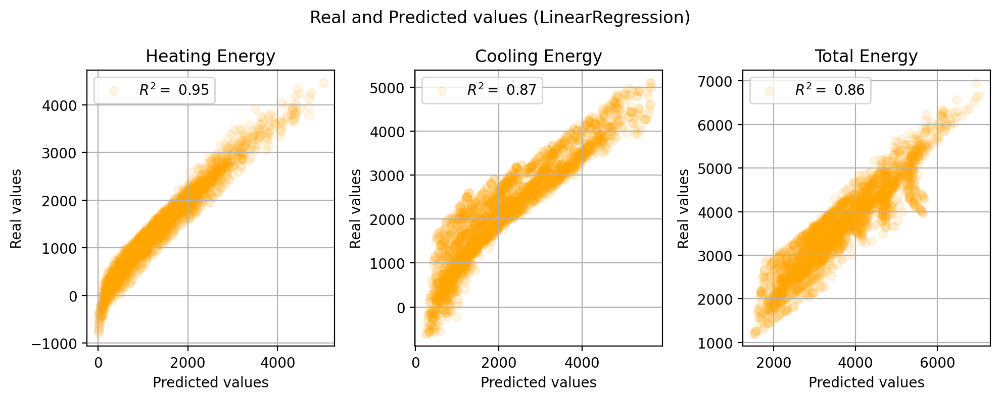

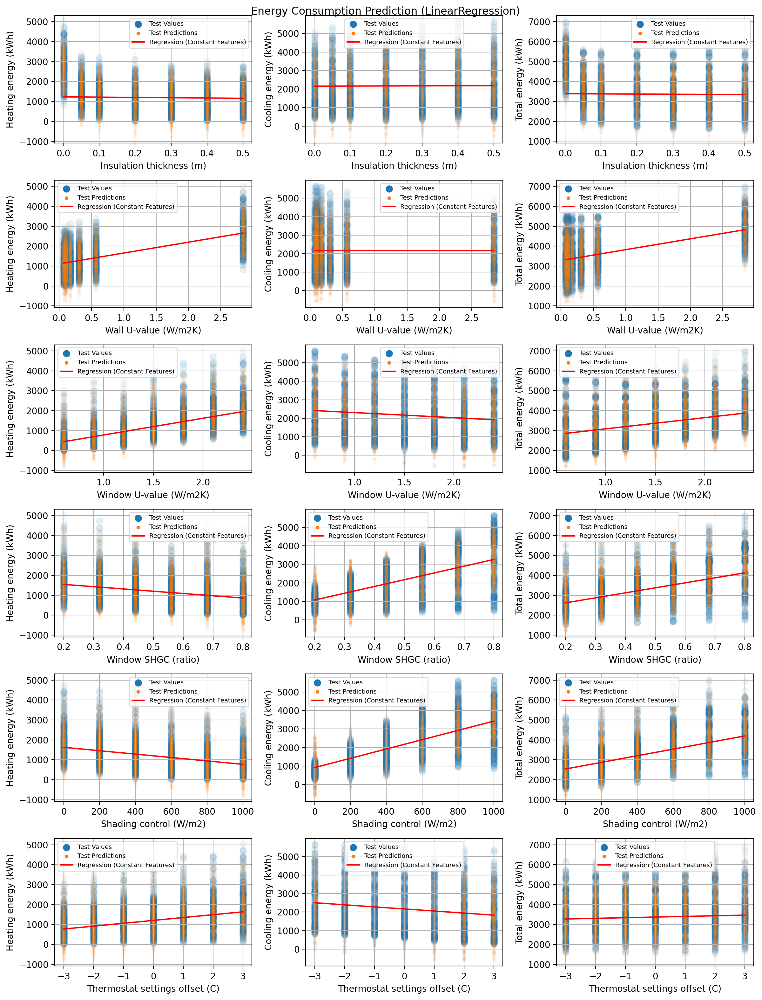

In [15]:
model = LinearRegression()
model.fit(X_train, y_train)
y_test_pred = model.predict(X_test)

get_evaluation_scores(y_test, y_test_pred)
plot_real_vs_pred_vals(y_test, y_test_pred, 'LinearRegression')
predict_energy_consumptions(y_test, y_test_pred, model, 'LinearRegression')

# Support Vector Regression (SVR)
A SVR-Model with RBF-Kernel is able to model nonlinear dynamics. However, it does not work well with this data either, scoring worse than the linear model.

--- Combined Scores ---
R2: 0.27
MSE: 814052.80

--- Heating Energy Scores ---
R2: 0.10
MSE: 719690.62

--- Cooling Energy Scores ---
R2: 0.44
MSE: 908338.79

--- Total Energy Scores ---
R2: 0.28
MSE: 814128.98


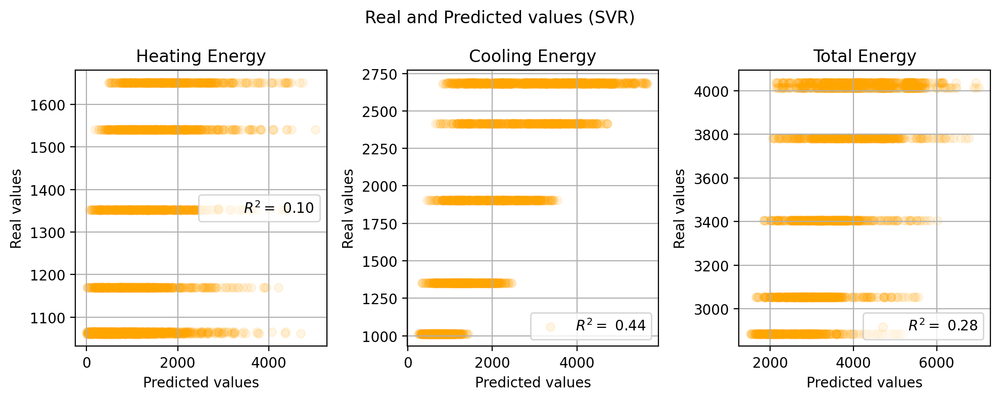

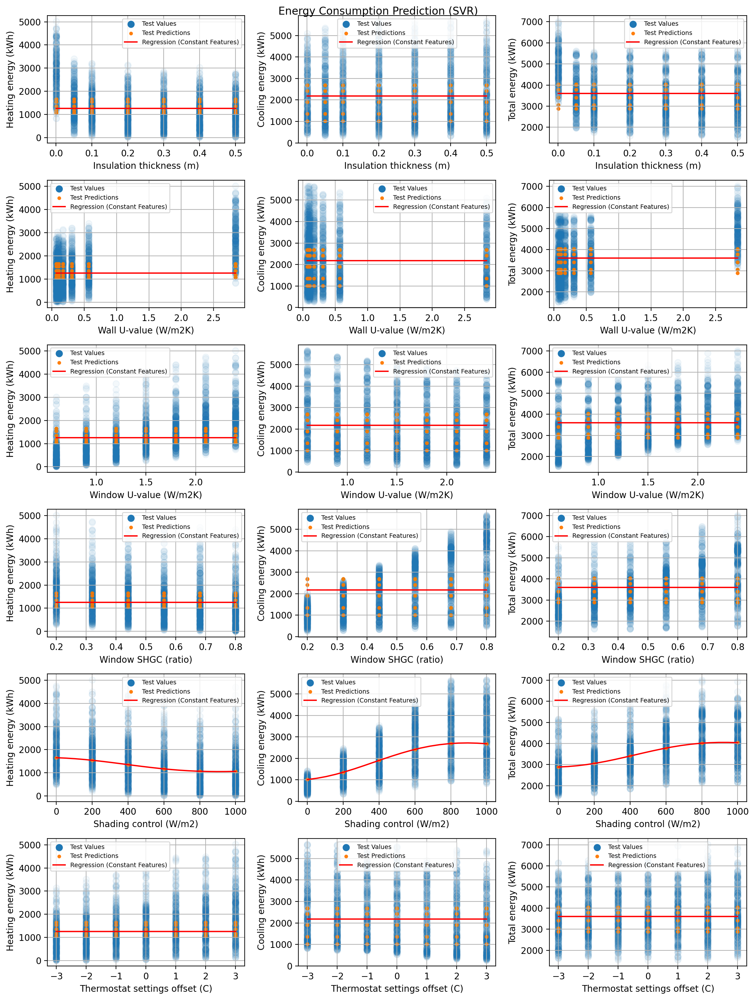

In [16]:
model = MultiOutputRegressor(SVR(kernel='rbf'))
model.fit(X_train, y_train)
y_test_pred = model.predict(X_test)

get_evaluation_scores(y_test, y_test_pred)
plot_real_vs_pred_vals(y_test, y_test_pred, 'SVR')
predict_energy_consumptions(y_test, y_test_pred, model, 'SVR')

# DecisionTreeRegressor
Using a DecisionTreeRegressor gives very good results in terms of R2 score and MSE. Since this model divides the feature values into small zones, each of which has one prediction, the regression curve can have visible "steps". The number of these steps depends on the selected hyperparameters for the model.

As can be seen on the plot below, due to the discrete training data values, the prediction is constant in areas where training data values are present, but steps occur between these values. This can make predictions less reliable for values that are not in the training data set.

--- Combined Scores ---
R2: 0.99
MSE: 5376.64

--- Heating Energy Scores ---
R2: 0.99
MSE: 8110.90

--- Cooling Energy Scores ---
R2: 1.00
MSE: 4783.17

--- Total Energy Scores ---
R2: 1.00
MSE: 3235.84


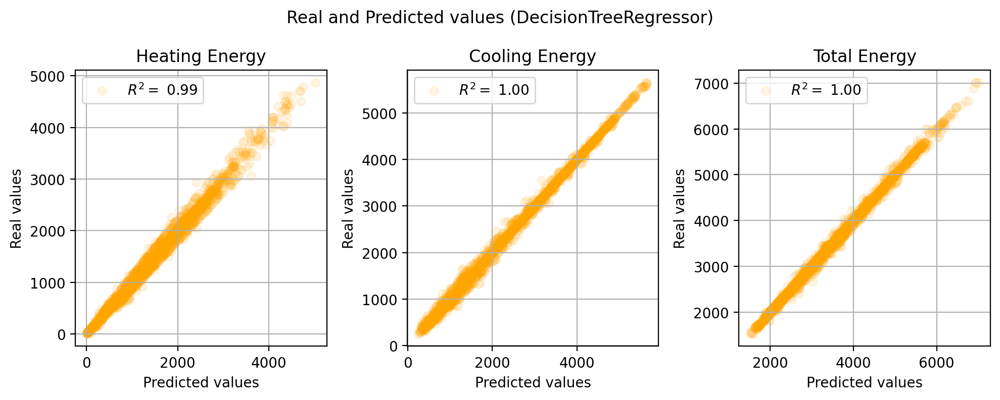

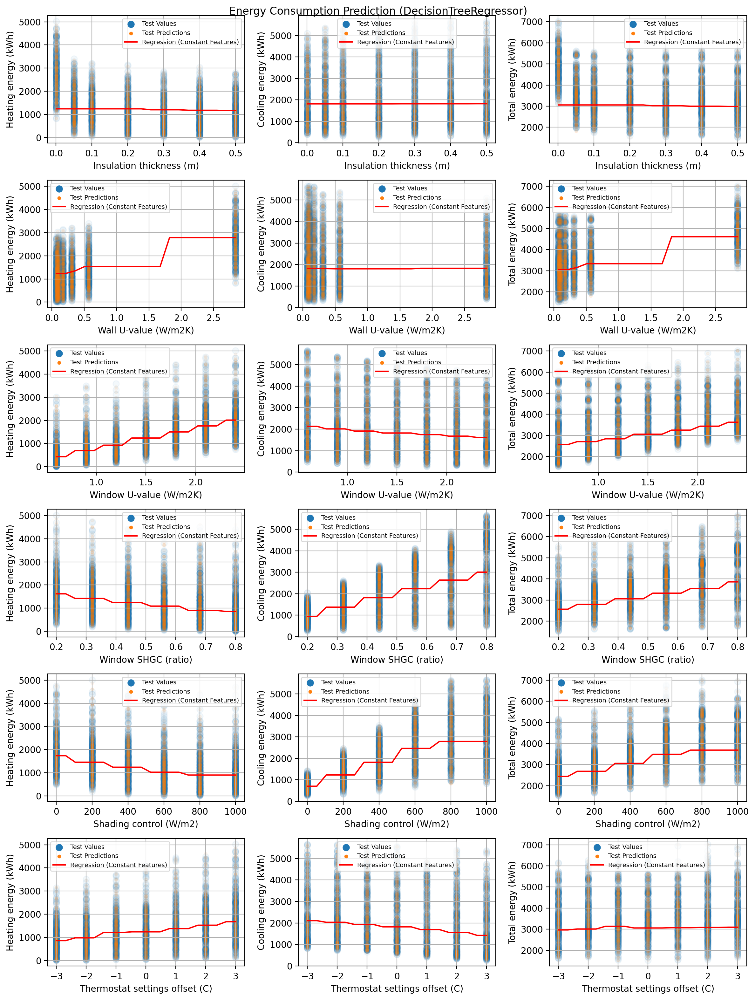

In [17]:
model = DecisionTreeRegressor()
model.fit(X_train, y_train)
y_test_pred = model.predict(X_test)

get_evaluation_scores(y_test, y_test_pred)
plot_real_vs_pred_vals(y_test, y_test_pred, 'DecisionTreeRegressor')
predict_energy_consumptions(y_test, y_test_pred, model, 'DecisionTreeRegressor')

# Polynomial Regression
A linear model with third degree polynomial features is used here. The third degree was chosen because it produces the highest evaluation scores, which are almost as good as those from DecisionTreeRegressor. Furthermore, the generated regression curve does not have those step effects, which makes the predictions better for values that are not included in the training data set. However, there are other questionable side effects, e.g. higher insulation thickness leads to higher heating energy consumption for input values between 0.2 and 0.4.

--- Combined Scores ---
R2: 1.00
MSE: 2143.46

--- Heating Energy Scores ---
R2: 1.00
MSE: 515.01

--- Cooling Energy Scores ---
R2: 1.00
MSE: 2676.00

--- Total Energy Scores ---
R2: 1.00
MSE: 3239.37


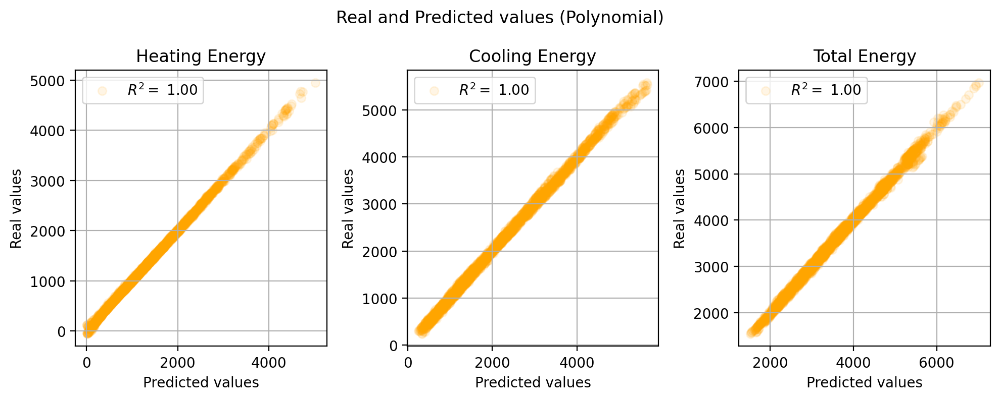

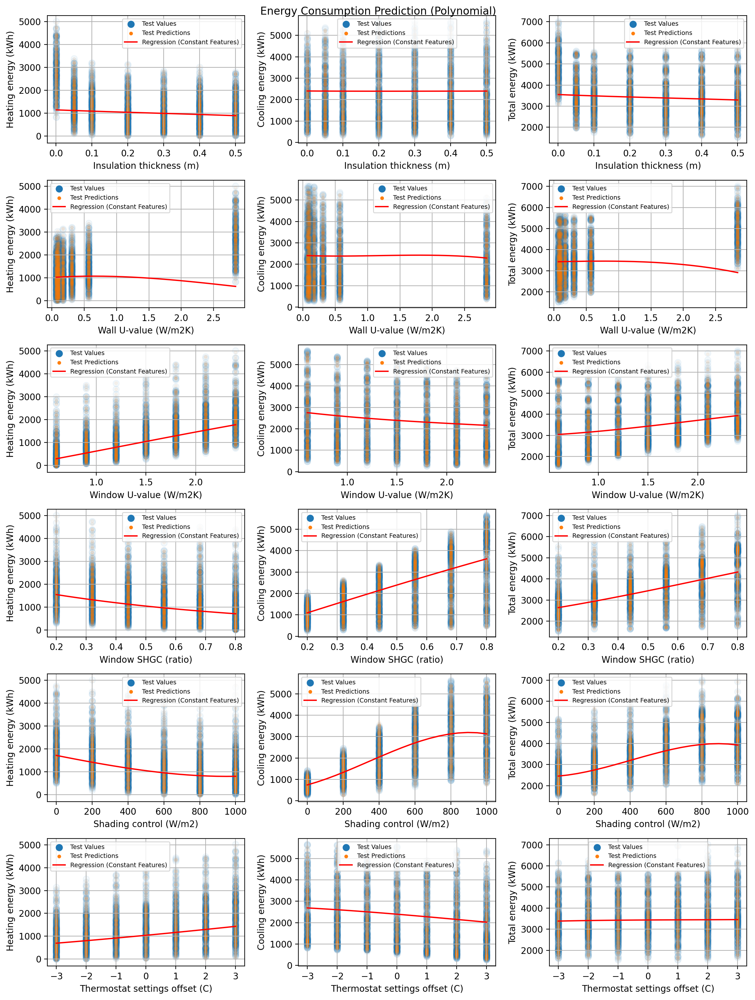

In [18]:
model = Pipeline([
    ('poly', PolynomialFeatures(degree=3)),
    ('linear', LinearRegression())
])
model.fit(X_train, y_train)
y_test_pred = model.predict(X_test)

get_evaluation_scores(y_test, y_test_pred)
plot_real_vs_pred_vals(y_test, y_test_pred, 'Polynomial')
predict_energy_consumptions(y_test, y_test_pred, model, 'Polynomial')